In [1]:
# import panel as pn
import pyvista as pv
import pyvistaqt as pvqt
import vtk
import pandas as pd
import numpy as np
import spiceypy as spice
import matplotlib.pyplot as plt
import glob
import math

In [2]:
!curl -L -o itokawa_sample_for_pyaigis.zip "https://arcspace.jp/lib/exe/fetch.php?media=aigis2:itokawa_sample_for_pyaigis.zip" &> /dev/null
!unzip -o itokawa_sample_for_pyaigis.zip &> /dev/null

In [3]:
user = "AiGIS-PyAiGIS"
repo = "PyAiGIS-examples"
pyfile = "pyaigis.py"
url = f"https://raw.githubusercontent.com/{user}/{repo}/main/{pyfile}"
!!curl -L -o {pyfile} {url} &> /dev/null

[]

In [4]:
import pyaigis

## Define a function to produce lat/lon grids

## Load a shape model

In [5]:
obj_low = "./Itokawa_sample/Shapemodel/Itokawa_49152.obj"
mesh_low = pv.read(obj_low)

### Prepare lat/lon grids for the model

In [6]:
lat_grid, lon_grid = pyaigis.latlon_grid(mesh_low, 10, 10)

## Load geographic information (map data)
- Example: AiGIS style tables

In [7]:
mapdata = pd.DataFrame()
mapdata_dir = "./Itokawa_sample/MapData/"
for mapdata_file in glob.glob(mapdata_dir + "*.txt"):
    print(mapdata_file)
    with open(mapdata_file,'r') as file:
        lines = file.readlines()
        data = [line.split('#', 1)[0].strip() for line in lines if not line.lstrip().startswith('#')]
        data_count = data[2]
        fin = int(data_count) + 3
    file.close()
    map = []
    with open(mapdata_file,'r') as file:
        lines = file.readlines()
        data = [line.split('#', 1)[0].strip() for line in lines if not line.lstrip().startswith('#')]
        for  line in data[3:fin]:
            row = []
            toks = line.split()
            if toks[1] == '-' :
                map.append(np.nan)
            else:
                map.append(float(toks[1]))

    file.close()
    map = np.array(map)

    file = open(mapdata_file, 'r')
    label = data[0]
    label = label.replace("\n","")
    file.close()
    mapdata[label] = map
# mapdata = pd.DataFrame()
# mapdata_dir = "./Itokawa_sample/MapData/"
# for mapdata_file in glob.glob(mapdata_dir + "*.txt"):
#     print(mapdata_file)
#     with open(mapdata_file,'r') as file:
#         data_count = file.readlines()[2].split('#')[0].strip() # dataが何個あるのかを調べてcountに入れている '#'以降はコメントとして無視
#         fin = int(data_count) + 3 #何行目まで読み込んでいいか末尾を計算していいる
#     file.close()
#     map = []
#     with open(mapdata_file,'r') as file:
#         for line in file.readlines()[3:fin]:
#             row = [] # 行のデータを保存するリスト 
#             toks = line.split() # 行をタブで分割する
#             #toks[1]にデータが入ってる
#             if toks[1] == '-' :
#                 map.append(np.nan) #mapdataの欠損値は'-'で書かれているから、それを欠損値に変換する作業を
#             else:
#                 map.append(float(toks[1]))
#     file.close()
#     map = np.array(map)
#     file = open(mapdata_file, 'r')
#     label = file.readline().split('#')[0].strip()
#     # label = label.replace("\n","")
#     file.close()
#     mapdata[label] = map #dataframeに選んだmapdataを追加していく

./Itokawa_sample/MapData/Itokawa_elevation_64.txt
./Itokawa_sample/MapData/AMICA_brightness.txt
./Itokawa_sample/MapData/Lidar_Shot_count.txt
./Itokawa_sample/MapData/itokawa_Gpotential20110111.txt
./Itokawa_sample/MapData/itokawa_slope20110111.txt
./Itokawa_sample/MapData/NIRS_ch30_11_1_13.txt
./Itokawa_sample/MapData/st_2422543206_v_map64.txt


## Check available map data
Index in the 1st line will be used to select a visualization target.

In [8]:
mapdata

,Elevation,AMICA_Brightness,LIDAR_Shot_count,Gravitational_Potential,Surface_Slope,NIRS_Albedo,st_2422543206
0,-3.451888,2208.0,12.0,1.332124e-08,8.327451,0.136988,NaN
1,-3.431725,2320.0,14.0,1.331943e-08,9.677955,0.137103,NaN
2,-3.906290,2400.0,18.0,1.336465e-08,19.696030,0.137116,NaN
3,-4.018442,2304.0,6.0,1.337372e-08,16.515810,0.137244,NaN
4,-4.496425,2320.0,21.0,1.341490e-08,8.457731,0.137221,NaN
...,...,...,...,...,...,...,...
49147,-13.372890,2672.0,5.0,1.402295e-08,20.296640,0.139043,NaN
49148,-13.574630,2576.0,5.0,1.403639e-08,16.779950,0.139327,NaN
49149,-13.981460,2528.0,9.0,1.407219e-08,18.056780,0.139327,NaN
49150,-13.653220,2592.0,4.0,1.404182e-08,17.979880,0.138906,NaN


In [9]:
mapdata.describe()

,Elevation,AMICA_Brightness,LIDAR_Shot_count,Gravitational_Potential,Surface_Slope,NIRS_Albedo,st_2422543206
count,49152.000000,45973.000000,49152.000000,4.915200e+04,49152.000000,42222.000000,24988.000000
mean,-3.375253,2431.308116,32.063599,1.340112e-08,14.196667,0.136741,132.580799
std,14.438469,179.976066,66.361229,1.176267e-09,9.423321,0.002627,27.114937
min,-24.620569,992.000000,0.000000,9.560400e-09,0.044690,0.127686,2.000000
25%,-13.643082,2320.000000,4.000000,1.274534e-08,6.845086,0.134798,128.000000
50%,-6.799241,2416.000000,10.000000,1.364825e-08,12.766270,0.136609,138.000000
75%,3.685183,2544.000000,27.000000,1.431146e-08,19.398435,0.138546,147.000000
max,52.933182,3568.000000,913.000000,1.518636e-08,77.450070,0.147254,185.000000


## Simple visualizaion
### Produce a static view

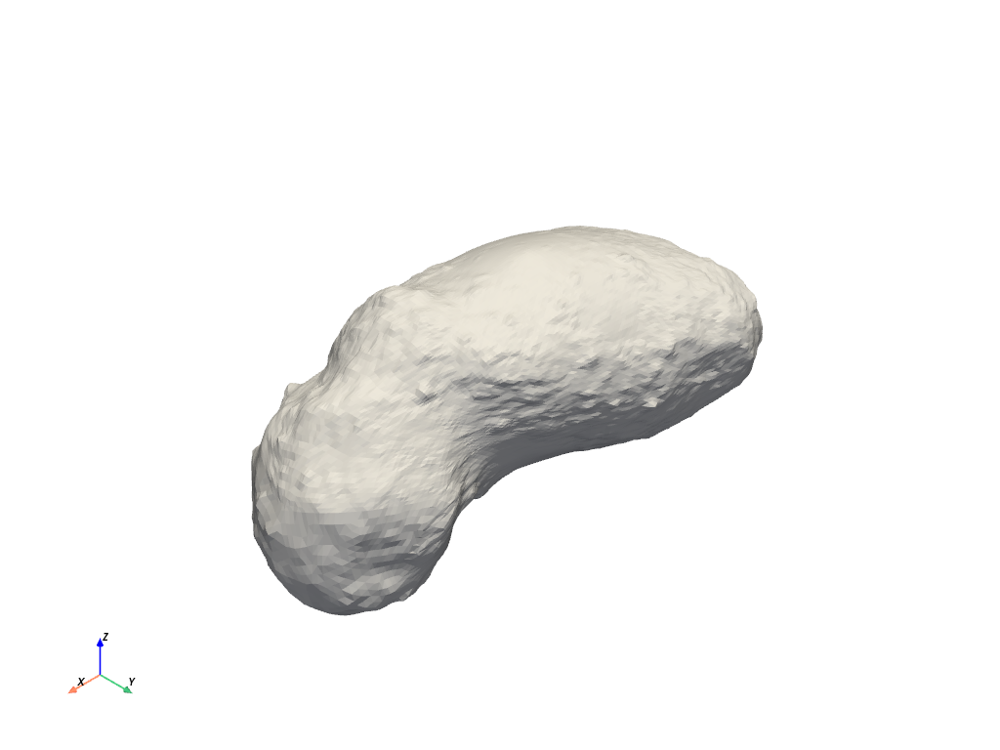

In [10]:
p = pv.Plotter(notebook=True)
p.add_mesh(mesh_low, color="w")
p.add_axes()
p.show(jupyter_backend="static", return_viewer=True)

### Add lat/lon grids

In [11]:
# pv.global_theme.allow_empty_mesh = True
p = pv.Plotter(notebook=True)
p.add_mesh(mesh_low, color="w")
[p.add_mesh(x, line_width=2, color="w") for x in list(lat_grid.values())]
[p.add_mesh(x, line_width=2, color="w") for x in list(lon_grid.values())]
p.add_axes()
p.show(jupyter_backend="html", return_viewer=True)

EmbeddableWidget(value='<iframe srcdoc="<!DOCTYPE html>\n<html>\n  <head>\n    <meta http-equiv=&quot;Content-…

### Produce a static view with user-defined viewing and illumination angles
You can change light_lat/_lon, camera_lat/_lon and rerun the cell to get other views.

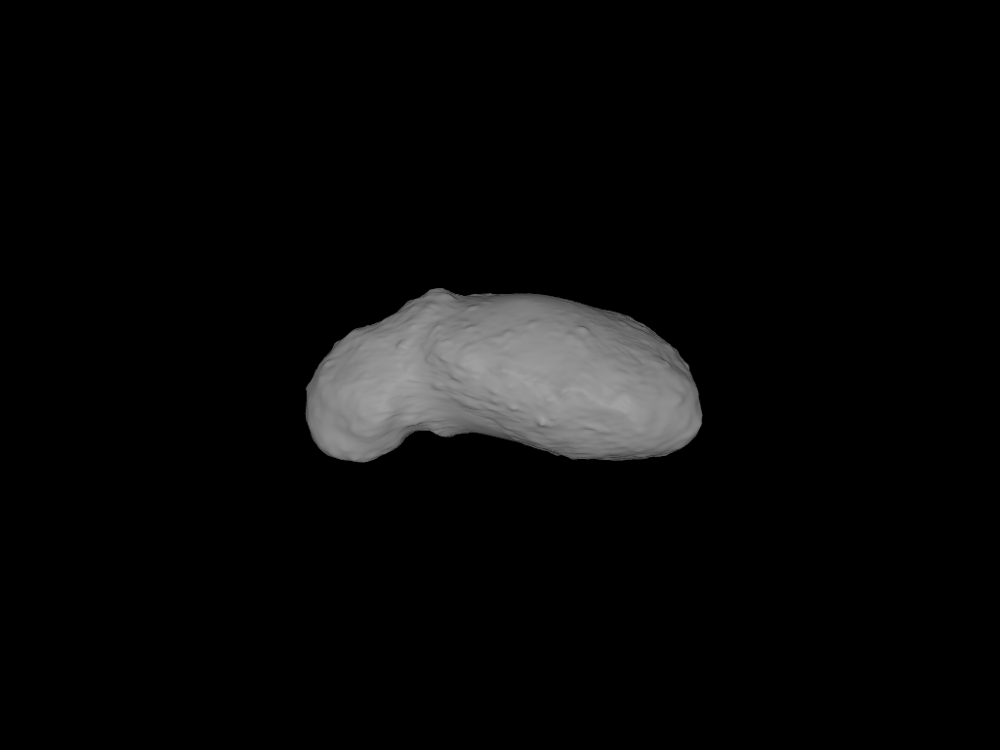

In [12]:
light_lat = 30 # change here
light_lon = 90 # change here
camera_lat = 30 # change here
camera_lon = 90 # change here

radius = 2.0
light_pos = spice.latrec(20, spice.rpd()*light_lon, spice.rpd()*light_lat)
camera_pos = spice.latrec(radius, spice.rpd()*camera_lon, spice.rpd()*camera_lat)

p = pv.Plotter(notebook=True, lighting='none')
p.background_color= 'black'
light = pv.Light(position=light_pos, color='w')
light.positional = True
p.add_mesh(mesh_low, color='w', pbr=True, diffuse=1)
p.add_light(light)
p.camera.position = camera_pos.tolist()
p.show(jupyter_backend="static", return_viewer=True)

## Produce an interactive view
1. Simple case

In [13]:
p = pv.Plotter(notebook=True) # Inline display
# p = pv.Plotter(notebook=False) # Window display (note: the python kernel may crash at closing the window.)
p.add_mesh(mesh_low, color="w")
p.add_axes()
# p.show(jupyter_backend='trame') # Trame inline display
# p.export_html('simple_1.html')  
p.show(jupyter_backend='html') # html inline display
# p.show() # Window display
# p.show(jupyter_backend="html", return_viewer=True) # Google Colab.

EmbeddableWidget(value='<iframe srcdoc="<!DOCTYPE html>\n<html>\n  <head>\n    <meta http-equiv=&quot;Content-…

2. with lat/lon grids

In [ ]:
p = pv.Plotter(notebook=True) # Inline display
# p = pv.Plotter(notebook=False) # Window display (note: the python kernel may crash at closing the window.)
p.add_mesh(mesh_low, color="w")
[p.add_mesh(x, line_width=2, color="w") for x in list(lat_grid.values())]
[p.add_mesh(x, line_width=2, color="w") for x in list(lon_grid.values())]
p.add_axes()
# p.show(jupyter_backend='trame') # Trame inline display
# p.export_html('simple_2.html')  
p.show(jupyter_backend='html') # html inline display
# p.show() # Window display
# p.show(jupyter_backend="html", return_viewer=True) # Google Colab.

EmbeddableWidget(value='<iframe srcdoc="<!DOCTYPE html>\n<html>\n  <head>\n    <meta http-equiv=&quot;Content-…

3. with the slope map data

In [ ]:
p = pv.Plotter(notebook=True)
p.add_mesh(mesh_low, scalars=mapdata["Surface_Slope"],
           scalar_bar_args={'title': 'Slope [deg]'},
           cmap="coolwarm",
           clim=[0, 45]
          )
[p.add_mesh(x, line_width=2, color="w") for x in list(lat_grid.values())]
[p.add_mesh(x, line_width=2, color="w") for x in list(lon_grid.values())]
p.add_axes()
# p.show(jupyter_backend='trame') # Trame inline display
# p.export_html('simple_3.html')  
p.show(jupyter_backend='html') # html inline display
# p.show() # Window display
# p.show(jupyter_backend="html", return_viewer=True) # Google Colab.
# If you want to see another mapdata, the following lines shoud be changed
# scalars=mapdata["Slope"]
# scalar_bar_args={'title': 'Slope [deg]'}
# clim=[0, 45]

EmbeddableWidget(value='<iframe srcdoc="<!DOCTYPE html>\n<html>\n  <head>\n    <meta http-equiv=&quot;Content-…

4. with the geopotential height  map data

In [ ]:
p = pv.Plotter(notebook=True)
p.add_mesh(mesh_low, scalars=mapdata["Elevation"],
           scalar_bar_args={'title': 'Elevation [m]'},
           cmap="coolwarm",
           clim=[-25, 55]
           )
[p.add_mesh(x, line_width=2, color="w") for x in list(lat_grid.values())]
[p.add_mesh(x, line_width=2, color="w") for x in list(lon_grid.values())]
p.add_axes()
# p.show(jupyter_backend='trame') # Trame inline display
# p.export_html('simple_4.html')  
p.show(jupyter_backend='html') # html inline display
# p.show() # Window display
# p.show(jupyter_backend="html", return_viewer=True) # Google Colab.
# If you want to see another mapdata, the following lines shoud be changed
# scalars=mapdata["Slope"]
# scalar_bar_args={'title': 'Slope [deg]'}
# clim=[0, 45]

EmbeddableWidget(value='<iframe srcdoc="<!DOCTYPE html>\n<html>\n  <head>\n    <meta http-equiv=&quot;Content-…

5. Produce elevation conters (the last referenced map data is referenced as the contour value.)

In [18]:
# Produce elevation conters (the last referenced map data is referenced as the contour value.)
contours_elevation = mesh_low.cell_data_to_point_data().contour(isosurfaces=np.arange(-25, 55, 1))
contours_elevation_10 = mesh_low.cell_data_to_point_data().contour(isosurfaces=np.arange(-20, 50, 10))

In [ ]:
p = pv.Plotter(notebook=True)
p.add_mesh(mesh_low, color="w")
p.add_mesh(contours_elevation_10, line_width=5, cmap='coolwarm', show_scalar_bar=False)
p.add_mesh(contours_elevation, line_width=2, cmap='coolwarm',
           scalar_bar_args={'title': 'Geopotential_Height [m]'})
[p.add_mesh(x, line_width=2, color="w") for x in list(lat_grid.values())]
[p.add_mesh(x, line_width=2, color="w") for x in list(lon_grid.values())]
p.add_axes()
# p.show(jupyter_backend='trame') # Trame inline display
# p.export_html('simple_5.html')  
p.show(jupyter_backend='html') # html inline display
# p.show() # Window display
# p.show(jupyter_backend="html", return_viewer=True) # Google Colab.

EmbeddableWidget(value='<iframe srcdoc="<!DOCTYPE html>\n<html>\n  <head>\n    <meta http-equiv=&quot;Content-…

## Synchronized views like the app. version of AiGIS

In [ ]:
p = pv.Plotter(shape=(2, 2), notebook=True)
p.link_views()

p.subplot(0, 0)
p.add_axes()
p.add_text("Low-res mesh", font_size=15)
p.add_mesh(mesh_low, color='lightgrey',
           copy_mesh=True)
[p.add_mesh(x, line_width=2, color="w") for x in list(lat_grid.values())]
[p.add_mesh(x, line_width=2, color="w") for x in list(lon_grid.values())]

p.subplot(0, 1)
p.add_axes()
p.add_text("Slope", font_size=15)
p.add_mesh(mesh_low, scalars=mapdata["Surface_Slope"], cmap="coolwarm", clim=[0, 45],
           scalar_bar_args={'title': 'Slope [deg]'},
           copy_mesh=True)
p.add_scalar_bar(title='Slope [deg]')
[p.add_mesh(x, line_width=2, color="w") for x in list(lat_grid.values())]
[p.add_mesh(x, line_width=2, color="w") for x in list(lon_grid.values())]

p.subplot(1, 0)
p.add_axes()
p.add_text("Elevation", font_size=15)
p.add_mesh(mesh_low, scalars=mapdata["Elevation"], cmap="coolwarm", clim=[-25, 55],
           scalar_bar_args={'title': 'Elevation [m]'},
           copy_mesh=True)
p.add_scalar_bar(title='Elevation [m]')
[p.add_mesh(x, line_width=2, color="w") for x in list(lat_grid.values())]
[p.add_mesh(x, line_width=2, color="w") for x in list(lon_grid.values())]

p.subplot(1, 1)
p.add_axes()
p.add_text("Gravitational_Potential", font_size=15)
p.add_mesh(mesh_low, scalars=mapdata["Gravitational_Potential"], cmap="coolwarm",
           scalar_bar_args={'title': 'Gravitational_Potential [km^2/s^2]'},
           copy_mesh=True)
p.add_scalar_bar(title='Gravitational_Potential [km^2/s^2]')
[p.add_mesh(x, line_width=2, color="w") for x in list(lat_grid.values())]
[p.add_mesh(x, line_width=2, color="w") for x in list(lon_grid.values())]

# p.show(jupyter_backend='trame') # Trame inline display
# p.export_html('multiview_1.html')  
p.show(jupyter_backend='html') # html inline display
# p.show() # Window display
# p.show(jupyter_backend="html", return_viewer=True) # Google Colab.
# If you want to see another mapdata, the following lines shoud be changed
# scalars=mapdata["Surface_Slope"]
# scalar_bar_args={'title': 'Surface_Slope [deg]'}
# p.add_scalar_bar(title='Surface_Slope [deg]')
# scalar_bar_args and the title of add_scalar_bar should be paired.

EmbeddableWidget(value='<iframe srcdoc="<!DOCTYPE html>\n<html>\n  <head>\n    <meta http-equiv=&quot;Content-…

## Same view in an independent and parmanent window of PyVistaQt

In [21]:
# Not work on Google Colab. environment
pq = pvqt.BackgroundPlotter(shape=(2, 2), notebook=True)
pq.link_views()

pq.subplot(0, 0)
pq.add_axes()
pq.add_text("Low-res mesh", font_size=15)
pq.add_mesh(mesh_low, color='lightgrey',
           copy_mesh=True)
[pq.add_mesh(x, line_width=2, color="w") for x in list(lat_grid.values())]
[pq.add_mesh(x, line_width=2, color="w") for x in list(lon_grid.values())]

pq.subplot(0, 1)
pq.add_axes()
pq.add_text("Slope", font_size=15)
pq.add_mesh(mesh_low, scalars=mapdata["Surface_Slope"], cmap="coolwarm", clim=[0, 45],
           scalar_bar_args={'title': 'Slope [deg]'},
           copy_mesh=True)
pq.add_scalar_bar(title='Slope [deg]')
[pq.add_mesh(x, line_width=2, color="w") for x in list(lat_grid.values())]
[pq.add_mesh(x, line_width=2, color="w") for x in list(lon_grid.values())]

pq.subplot(1, 0)
pq.add_axes()
pq.add_text("Elevation", font_size=15)
pq.add_mesh(mesh_low, scalars=mapdata["Elevation"], cmap="coolwarm", clim=[-25, 55],
           scalar_bar_args={'title': 'Elevation [m]'},
           copy_mesh=True)
pq.add_scalar_bar(title='Elevation [m]')
[pq.add_mesh(x, line_width=2, color="w") for x in list(lat_grid.values())]
[pq.add_mesh(x, line_width=2, color="w") for x in list(lon_grid.values())]

pq.subplot(1, 1)
pq.add_axes()
pq.add_text("Gravitational_Potential", font_size=15)
pq.add_mesh(mesh_low, scalars=mapdata["Gravitational_Potential"], cmap="coolwarm",
           scalar_bar_args={'title': 'Gravitational_Potential [km^2/s^2]'},
           copy_mesh=True)
pq.add_scalar_bar(title='Gravitational_Potential [km^2/s^2]')
[pq.add_mesh(x, line_width=2, color="w") for x in list(lat_grid.values())]
[pq.add_mesh(x, line_width=2, color="w") for x in list(lon_grid.values())]

pq.show() # Window display

## Analysis example
- Check a distribution of slope and height

Text(0, 0.5, 'Geopotential_Height [m]')

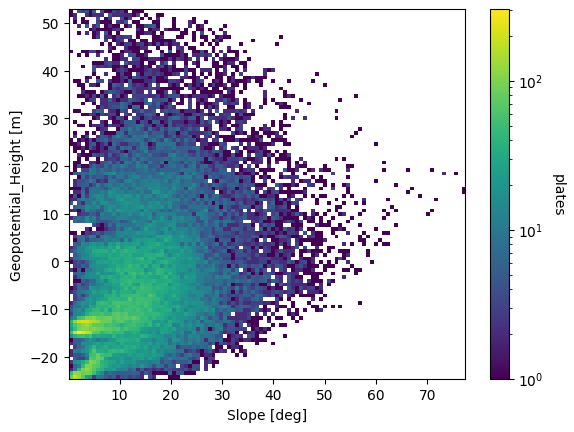

In [22]:
import matplotlib.colors
x, y = mapdata['Surface_Slope'], mapdata['Elevation']
plt.hist2d(x, y, bins=100, cmap='viridis', cmin=1, norm=matplotlib.colors.LogNorm())
cb = plt.colorbar()
cb.set_label('plates', rotation=270, labelpad=15)
plt.xlabel('Slope [deg]')
plt.ylabel('Geopotential_Height [m]')

### Show regions where slope and height within a condition

In [ ]:
tmp=mapdata['Surface_Slope'].where(
    (mapdata['Surface_Slope']< 10)
    & (mapdata['Elevation'] < -10)
    & (mapdata['Elevation'] > -25)
    , np.nan)
p = pv.Plotter(notebook=True)
p.add_mesh(mesh_low, scalars=tmp, scalar_bar_args={'title': 'Slope [deg]'})
# p.show(jupyter_backend='trame') # Trame inline display
# p.export_html('analysis_1.html')  
p.show(jupyter_backend='html') # html inline display
# p.show() # Window display
# p.show(jupyter_backend="html", return_viewer=True) # Google Colab.

EmbeddableWidget(value='<iframe srcdoc="<!DOCTYPE html>\n<html>\n  <head>\n    <meta http-equiv=&quot;Content-…

## Visualization of vector field data
### load a data

In [24]:
Gravitydata = pd.read_csv('Itokawa_sample/itokawa_f49152_GFandSlope.txt',
                       sep='\s+', skiprows=4, index_col="#PlateID")

In [25]:
Gravitydata

,center.x,center.y,center.z,lon,lat,CRefAccx,CRefAccy,CRefAccz,attract.x,attract.y,attract.z,Gpotential,Rpotential,Tpotential,GeopotentialSlope,normal.x,normal.y,normal.z,area
#PlateID,,,,,,,,,,,,,,,,,,,
1,-0.148537,0.081457,0.076603,151.259886,24.331928,-0.000003,0.000002,-0.0,-0.000033,0.000035,0.000062,0.013671,0.000297,-0.013968,6.260537,-4.5145,5.0240,11.1246,6507265.0
2,-0.149840,0.080393,0.076493,151.785203,24.220273,-0.000003,0.000002,-0.0,-0.000033,0.000034,0.000062,0.013669,0.000299,-0.013968,7.982436,-4.8619,4.1643,11.1513,6429054.0
3,-0.148107,0.078897,0.077597,151.955698,24.816165,-0.000003,0.000002,-0.0,-0.000033,0.000033,0.000063,0.013716,0.000291,-0.014007,18.443100,-4.8328,1.6968,12.0296,6537323.0
4,-0.149430,0.077813,0.077280,152.492459,24.640911,-0.000003,0.000002,-0.0,-0.000034,0.000033,0.000063,0.013725,0.000294,-0.014019,14.918880,-4.3567,2.5695,11.7776,6408881.0
5,-0.147713,0.076320,0.078403,152.675666,25.246555,-0.000003,0.000002,-0.0,-0.000033,0.000032,0.000064,0.013767,0.000286,-0.014053,6.367602,-4.3964,4.5831,11.1073,6397368.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49148,0.131493,0.060710,-0.051203,24.782601,-19.470384,0.000003,0.000001,-0.0,0.000011,0.000050,-0.000046,0.014391,0.000217,-0.014608,19.045090,-1.4872,10.7068,-6.5806,6327551.0
49149,0.131150,0.061600,-0.049990,25.159031,-19.034732,0.000003,0.000001,-0.0,0.000011,0.000051,-0.000045,0.014405,0.000217,-0.014622,14.760820,-1.0098,7.5186,-7.4946,5331934.0
49150,0.129317,0.061783,-0.049520,25.536967,-19.061357,0.000003,0.000001,-0.0,0.000011,0.000052,-0.000045,0.014442,0.000213,-0.014654,16.121110,-1.1637,7.3077,-6.7669,5013672.0


### Compute gravity vectors projected on the surface

In [26]:
# Compute gravity vectors projected on the surface
centers = mesh_low.cell_centers()
Gravity = Gravitydata.filter(items=['attract.x', 'attract.y', 'attract.z'], axis=1).to_numpy()
normal = Gravitydata.filter(items=['normal.x', 'normal.y', 'normal.z'], axis=1).to_numpy()
prjGrav = np.empty((0,3))
for i in range(0,len(Gravitydata),1):
    tmp = [spice.vhat(spice.vprjp(Gravity[i]*(-1), spice.nvc2pl(normal[i].tolist(), 0.0)))]
    prjGrav=np.append(prjGrav, tmp, axis=0)

### Convert mesh to points data with gravity data

In [27]:
# Convert mesh to points data with gravity data
centers["prjGrav"] = prjGrav
centers["Gravity"] = Gravity
centers["normal"] = normal
centers["slope"] = Gravitydata.filter(items=['GeopotentialSlope'], axis=1).to_numpy()

### Prepare vector arrow glyphs

In [28]:
arrows_prjGrav_s = centers.glyph(orient="prjGrav", scale="slope", factor=0.001, tolerance=0.005)
arrows_prjGrav_n = centers.glyph(orient="prjGrav", scale="prjGrav", factor=0.005, tolerance=0.005)
arrows_Gravity = centers.glyph(orient="Gravity", scale="Gravity", factor=100.0, tolerance=0.02)
arrows_normal = centers.glyph(orient="normal", factor=0.01, tolerance=0.02)

### Visualize gravity vector arrows

In [ ]:
# p = pv.Plotter(notebook=False)
p = pv.Plotter()
p.add_mesh(arrows_prjGrav_s, lighting=False, scalar_bar_args={'title': "Slope [deg]"})
p.add_mesh(mesh_low, color="w")
[p.add_mesh(x, line_width=2, color="w") for x in list(lat_grid.values())]
[p.add_mesh(x, line_width=2, color="w") for x in list(lon_grid.values())]
p.view_xy()
# p.show(jupyter_backend='trame') # Trame
# p.export_html('vector_1.html')  
p.show(jupyter_backend='html') # html
# p.show(jupyter_backend="html", return_viewer=True) # Google Colab.

EmbeddableWidget(value='<iframe srcdoc="<!DOCTYPE html>\n<html>\n  <head>\n    <meta http-equiv=&quot;Content-…

In [ ]:
p = pv.Plotter()
p.add_text('Slope and slope direction', font_size=16)
p.add_mesh(arrows_prjGrav_n, lighting=False, color="white", scalar_bar_args={'title': "Slope [deg]"})
p.add_mesh(mesh_low, lighting=False, scalars=mapdata["Surface_Slope"], cmap="coolwarm",
           scalar_bar_args={'title': 'Slope [deg]'},
           clim=[0, 45])
[p.add_mesh(x, line_width=2, color="w") for x in list(lat_grid.values())]
[p.add_mesh(x, line_width=2, color="w") for x in list(lon_grid.values())]
p.view_xy()
# p.show(jupyter_backend='trame') # Trame
# p.export_html('vector_2.html')  
p.show(jupyter_backend='html') # html
# p.show(jupyter_backend="html", return_viewer=True) # Google Colab.

EmbeddableWidget(value='<iframe srcdoc="<!DOCTYPE html>\n<html>\n  <head>\n    <meta http-equiv=&quot;Content-…

In [31]:
# Last mapdata will be kept as Active Scalars, and unintentionally appeared in the following views.
# To reset the Active Scalars, run this cell.
mesh_low.set_active_scalars(None)

(<FieldAssociation.NONE: 2>, array([], dtype=float64))

## Example of advanced feature
### Picking up a point coordination
Right click to select a point on the surface

In [ ]:
# Not work in Google Colab. environment, predefined coordinates are used
# Choose 2 points by right clicking on the model
# marking_list = [[0.01167, -0.14576, -0.0014], [0.00459, -0.1294, 0.02933]] # for Google Colab. users
marking_list = pyaigis.model_marking(mesh_low, mode=2)
# marking_list = pyaigis.model_marking_inline(mesh_low, mode=2)

In [37]:
marking_list

[[0.01167, -0.14576, -0.0014], [0.00459, -0.1294, 0.02933]]

In [38]:
circle = pyaigis.get_circle(marking_list, mesh_low)
line = pyaigis.get_line(marking_list, mesh_low)

2025-03-13 13:59:58.004 ( 455.605s) [          629E80]vtkPolyDataPlaneCutter.:589   INFO| Executing vtkPolyData plane cutter


In [ ]:
p = pv.Plotter()
p.add_mesh(mesh_low, color="w")
p.add_mesh(circle, color="blue", line_width=2)
p.add_mesh(line, color="blue", line_width=2)
# p.show(jupyter_backend='trame') # Trame
# p.export_html('marking_1.html')  
p.show(jupyter_backend='html') # html
# p.show(jupyter_backend="html", return_viewer=True) # Google Colab.

EmbeddableWidget(value='<iframe srcdoc="<!DOCTYPE html>\n<html>\n  <head>\n    <meta http-equiv=&quot;Content-…

In [40]:
geoheight_line = pyaigis.extract_profile(line, mesh_low, mapdata["Elevation"])

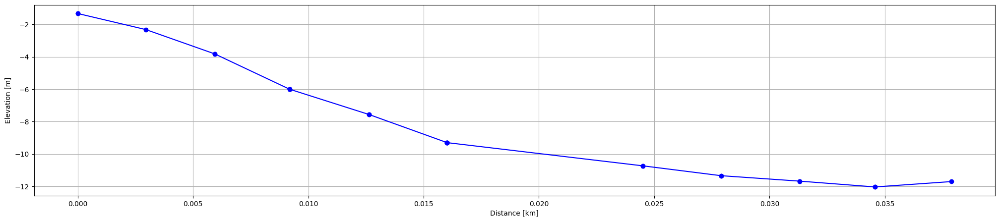

In [41]:
plt.figure(figsize=(25, 5))
plt.plot(geoheight_line.T[0], geoheight_line.T[1], marker='o', linestyle='-', color='b')

plt.xlabel('Distance [km]')
plt.ylabel('Elevation [m]')

plt.grid(True)
plt.show()

In [42]:
image = "./Itokawa_sample/Images/new_itokawa_mosaic.jpg"
texture = pv.read_texture(image)

In [43]:
mesh_low_globalmap = pyaigis.meshforglobalmap(mesh_low)

In [ ]:
p = pv.Plotter(notebook=True) # Inline display
# p = pv.Plotter(notebook=False) # Window display (note: the python kernel may crash at closing the window.)
p.add_mesh(mesh_low_globalmap, color="w", lighting=False, texture=texture)
[p.add_mesh(x, line_width=2, color="w") for x in list(lat_grid.values())]
[p.add_mesh(x, line_width=2, color="w") for x in list(lon_grid.values())]
p.add_axes()
# p.show(jupyter_backend='trame') # Trame inline display
# p.export_html("mapimage.html")
p.show(jupyter_backend='html') # html inline display
# p.show() # Window display
# p.show(jupyter_backend="html", return_viewer=True) # Google Colab.

EmbeddableWidget(value='<iframe srcdoc="<!DOCTYPE html>\n<html>\n  <head>\n    <meta http-equiv=&quot;Content-…

In [46]:
# geoheight_line = pyaigis.extract_profile(line, mesh_low, mapdata["Geopotential_Height"])
# eq_line = pv.wrap(lat_grid[0].GetOutput())
geoheight_line_eq = pyaigis.extract_profile(lon_grid[0], mesh_low, mapdata["Elevation"])

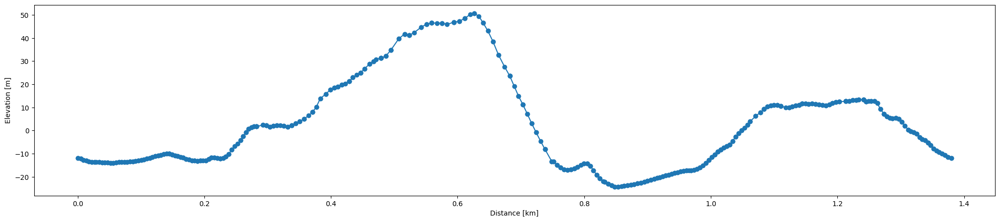

In [47]:
plt.figure(figsize=(25, 5))
plt.plot(geoheight_line_eq.T[0], geoheight_line_eq.T[1], marker='o', linestyle='-')

plt.xlabel('Distance [km]')
plt.ylabel('Elevation [m]')
plt.show()